In [1]:
cd ../src

/Users/christopher.lennan/github_repos/image-quality-assessment/src


In [2]:
import os
import numpy as np
from scipy.stats import spearmanr
from utils.losses import earth_movers_distance
import matplotlib.pyplot as plt
import keras
from keras import backend as K
from keras.models import load_model
from handlers.data_generator import TrainDataGenerator
from handlers.model_builder import Nima
from utils.utils import load_json
from sklearn.metrics import accuracy_score
from PIL import Image
%matplotlib inline

/Users/christopher.lennan/.venvs/py36/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [14]:
# utils
def load_image(image_file, target_size=(224, 224)):
    img = Image.open(image_file).convert('RGB')
    return np.array(img.resize(target_size))


def get_prediction(img, model):
    img = img.astype(np.float32)
    img = model.preprocessing_function()(img)
    return model.nima_model.predict(img)


def get_true_scores(image_files, samples):
    true_scores = []
    for image_file in image_files:
        img_id = os.path.basename(image_file).split('.')[0]
        true_score = [i['label'] for i in samples if i['image_id'] == img_id]
        true_scores.append(true_score[0])
    return true_scores


def calc_expected_value(score_dist):
    score_prob_dist = score_dist/np.sum(score_dist)
    return np.round((score_prob_dist * np.arange(1, 11)).sum(), 3)


def calc_std(p_dist):
    x = np.arange(1, 11)
    mean = (x*p_dist).sum()
    return ((p_dist*(x-mean)**2).sum())**0.5
    

def plot_images(image_files, true_scores,  model):
    fig = plt.figure(figsize=(15, 5))
    pred_mean_scores = []
    true_mean_scores = []
    imgs = []
    for i, image_file in enumerate(image_files):
        img = load_image(os.path.join(IMAGE_DIR, image_files[i]))
        imgs.append(img)
        prediction = get_prediction(np.expand_dims(img, axis=0), model)
        pred_mean_score = calc_expected_value(prediction)
        true_mean_score = calc_expected_value(true_scores[i])
        pred_mean_scores.append(pred_mean_score)
        true_mean_scores.append(true_mean_score)
        
    idx_sorted_true = np.argsort(true_mean_scores)[::-1]
    idx_sorted_pred = np.argsort(pred_mean_scores)[::-1]
    
    fig = plt.figure(figsize=(15, 5))
    for i, idx in enumerate(idx_sorted_true):
        plt.subplot(1, len(image_files), i+1)
        plt.imshow(imgs[idx])
        plt.title('true: {}; predicted: {}'.format(np.round(true_mean_scores[idx], 2), np.round(pred_mean_scores[idx], 2)))
        plt.axis('off')
    plt.show()
    

def save_images(image_files, true_scores,  model, target_dir):

    pred_mean_scores = []
    true_mean_scores = []
    imgs = []
    for i, image_file in enumerate(image_files):
        img = load_image(os.path.join(IMAGE_DIR, image_files[i]))
        imgs.append(img)
        prediction = get_prediction(np.expand_dims(img, axis=0), model)
        pred_mean_score = calc_expected_value(prediction)
        true_mean_score = calc_expected_value(true_scores[i])
        pred_mean_scores.append(pred_mean_score)
        true_mean_scores.append(true_mean_score)
        
    idx_sorted_true = np.argsort(true_mean_scores)[::-1]
    idx_sorted_pred = np.argsort(pred_mean_scores)[::-1]
    
    fig = plt.figure(figsize=(15, 5))
    for i, idx in enumerate(idx_sorted_true):
        plt.subplot(1, len(image_files), i+1)
        plt.imshow(imgs[idx])
        plt.title('true: {}; predicted: {}'.format(np.round(true_mean_scores[idx], 2), np.round(pred_mean_scores[idx], 2)))
        plt.axis('off')
    plt.tight_layout()
    extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    plt.savefig(os.path.join(target_dir, image_file+'_technical.svg'), bbox_inches=extent.expanded(1.1, 1.1))
    

In [74]:
# tid2013 image visualizations
# MODEL_WEIGHTS_FILE = '/Users/christopher.lennan/hotel-image-assessment/weights_vgg16_0.059.hdf5'
MODEL_WEIGHTS_FILE = '../models/MobileNet/weights_mobilenet_technical_0.11.hdf5'
KERAS_BASENET_NAME = 'MobileNet'
VALIDATION_SAMPLES_FILE = '../data/TID2013/tid_labels_test.json'
#IMAGE_DIR = '/Users/christopher.lennan/hotel-image-assessment/data/tid2013/images'
IMAGE_DIR = '/Users/christopher.lennan/github_repos/image-quality-assessment/_readme/images_aesthetic'
IMAGE_FILES_NON_DISTORTED = [
    'I01_01_1.bmp',
    'I02_01_1.bmp',
    'I03_01_1.bmp',
    'I04_01_1.bmp',
]

DISTORTIONS = {
        #1: 'Additive Gaussian noise',
        #2: 'Additive noise in color components is more intensive than additive noise in the luminance component',
        #3: 'Spatially correlated noise',
        #4: 'Masked noise',
        5: 'High frequency noise',
        #6: 'Impulse noise',
        #7: 'Quantization noise',
        8: 'Gaussian blur',
        #9: 'Image denoising',
        #10: 'JPEG compression',
        11: 'JPEG2000 compression',
        #12: 'JPEG transmission errors',
        #13: 'JPEG2000 transmission errors',
        #14: 'Non eccentricity pattern noise',
        #15: 'Local block-wise distortions of different intensity',
        #16: 'Mean shift (intensity shift)',
        #17: 'Contrast change',
        18: 'Change of color saturation',
        #19: 'Multiplicative Gaussian noise',
        #20: 'Comfort noise',
        #21: 'Lossy compression of noisy images',
        #22: 'Image color quantization with dither',
        #23: 'Chromatic aberrations',
        #24: 'Sparse sampling and reconstruction',
    }

DEGREES = [3, 5]

# load test samples
samples = load_json(VALIDATION_SAMPLES_FILE)
samples += load_json('../data/TID2013/tid_labels_train.json')

# load trained model
nima = Nima(KERAS_BASENET_NAME, n_classes=10, learning_rate=1e-3, dropout_rate=0.75)
nima.build()
nima.nima_model.load_weights(MODEL_WEIGHTS_FILE)
nima.compile()

def get_distorted_image_files(image_file_non_distorted, distortions, degrees):
    image_files_d = []
    image_file_nd = image_file_non_distorted.lower()
    img_id = image_file_nd.split('_')[0]
    for dis in distortions:
        dis = str(dis)
        dis = '0'+dis if len(dis) == 1 else dis
        for deg in degrees:
            image_file_nd.split('_')
            image_files_d.append('_'.join([img_id, str(dis), str(deg)+'.bmp']))
    return image_files_d


    

High frequency noise:
['I01_01_1.bmp', 'i01_05_3.bmp', 'i01_05_5.bmp']
['I02_01_1.bmp', 'i02_05_3.bmp', 'i02_05_5.bmp']
['I03_01_1.bmp', 'i03_05_3.bmp', 'i03_05_5.bmp']
['I04_01_1.bmp', 'i04_05_3.bmp', 'i04_05_5.bmp']
Gaussian blur:
['I01_01_1.bmp', 'i01_08_3.bmp', 'i01_08_5.bmp']
['I02_01_1.bmp', 'i02_08_3.bmp', 'i02_08_5.bmp']
['I03_01_1.bmp', 'i03_08_3.bmp', 'i03_08_5.bmp']
['I04_01_1.bmp', 'i04_08_3.bmp', 'i04_08_5.bmp']
JPEG2000 compression:
['I01_01_1.bmp', 'i01_11_3.bmp', 'i01_11_5.bmp']
['I02_01_1.bmp', 'i02_11_3.bmp', 'i02_11_5.bmp']
['I03_01_1.bmp', 'i03_11_3.bmp', 'i03_11_5.bmp']
['I04_01_1.bmp', 'i04_11_3.bmp', 'i04_11_5.bmp']
Change of color saturation:
['I01_01_1.bmp', 'i01_18_3.bmp', 'i01_18_5.bmp']
['I02_01_1.bmp', 'i02_18_3.bmp', 'i02_18_5.bmp']
['I03_01_1.bmp', 'i03_18_3.bmp', 'i03_18_5.bmp']
['I04_01_1.bmp', 'i04_18_3.bmp', 'i04_18_5.bmp']


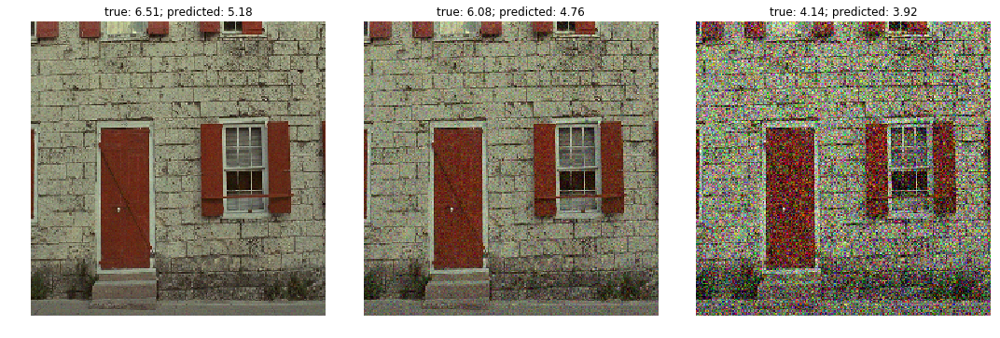

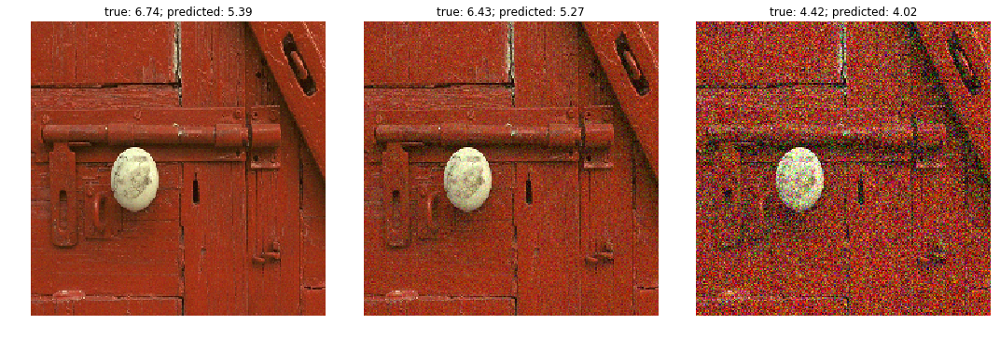

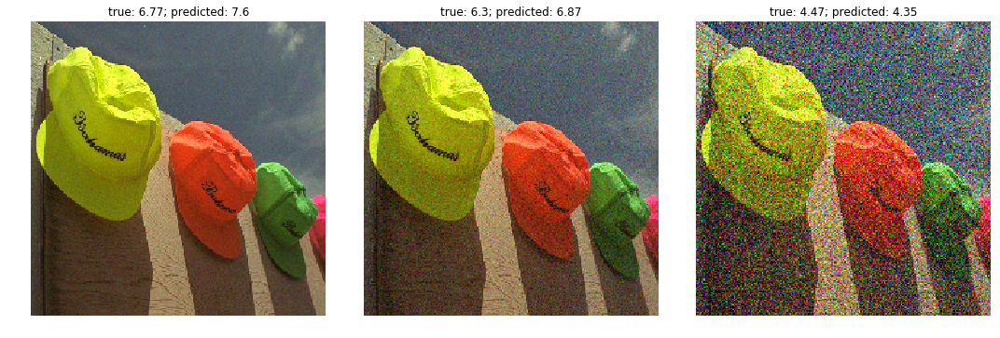

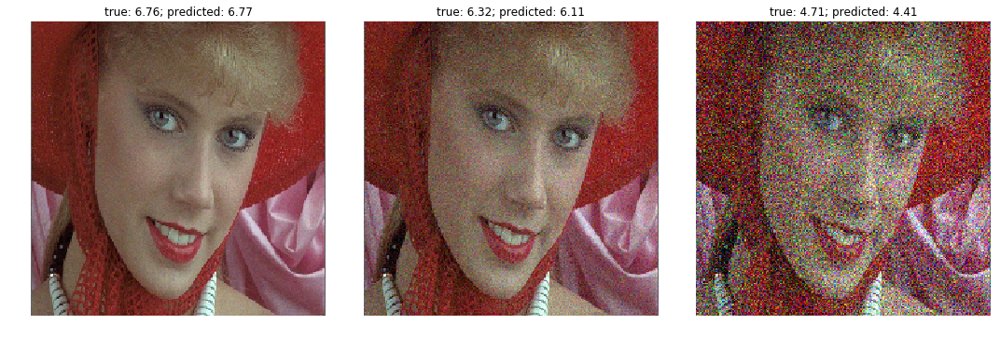

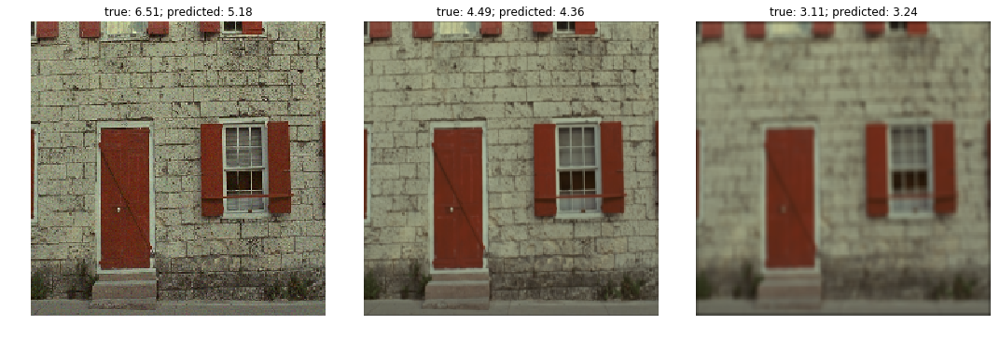

...

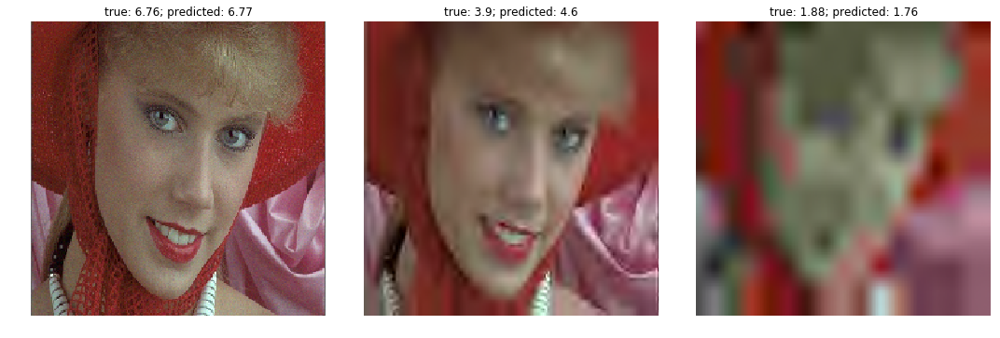

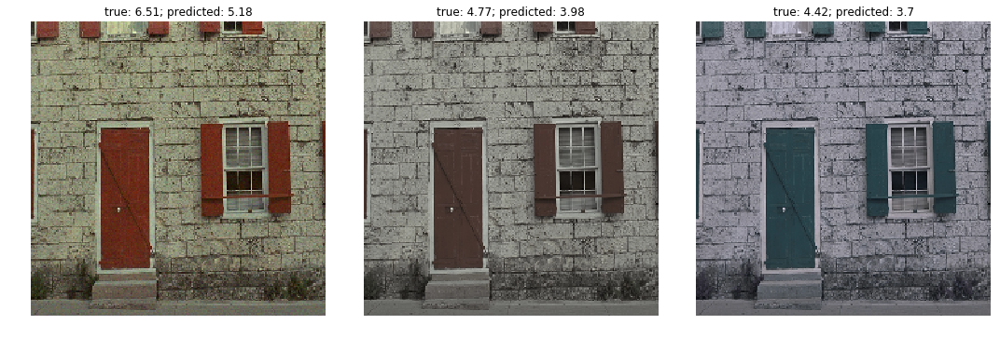

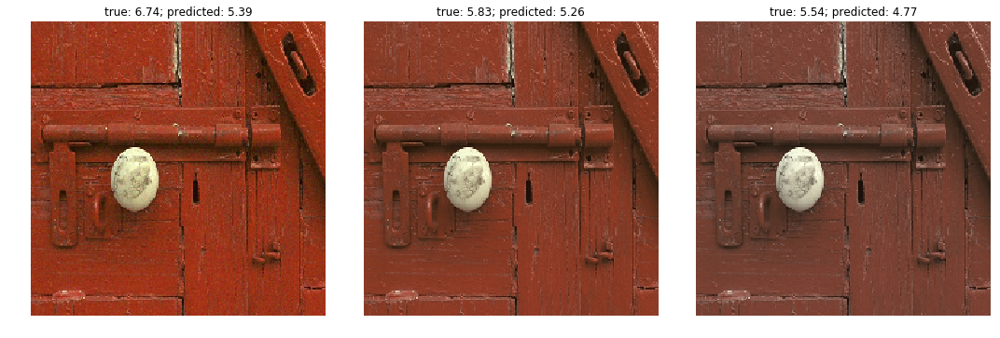

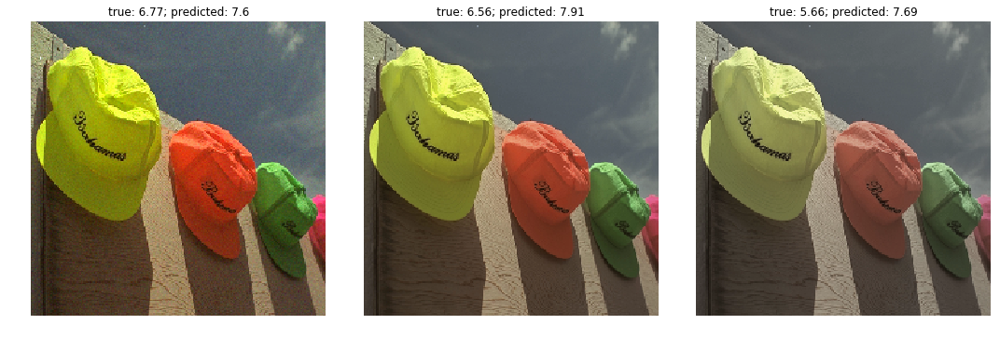

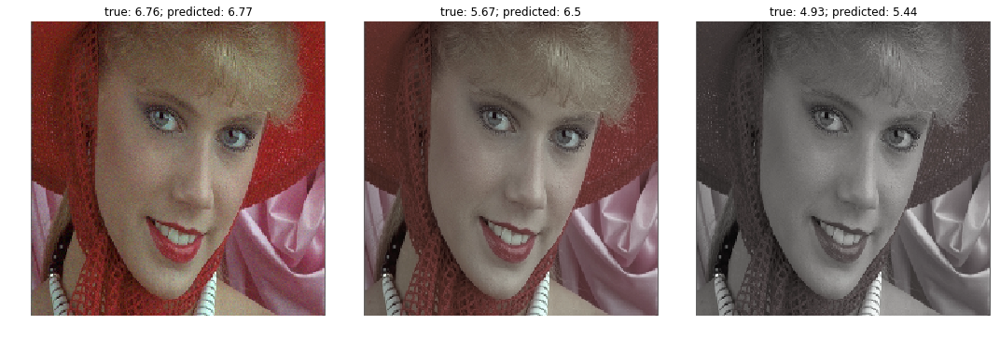

In [78]:
for distortion in DISTORTIONS.keys():
    print('{}:'.format(DISTORTIONS[distortion]))
    for image_file_nd in IMAGE_FILES_NON_DISTORTED:
        image_files = [image_file_nd] + get_distorted_image_files(image_file_nd, [distortion], DEGREES)
        print(image_files)
        true_scores = get_true_scores(image_files, samples)
        save_images(image_files, true_scores, nima, os.path.join(os.getcwd(), '../_readme'))

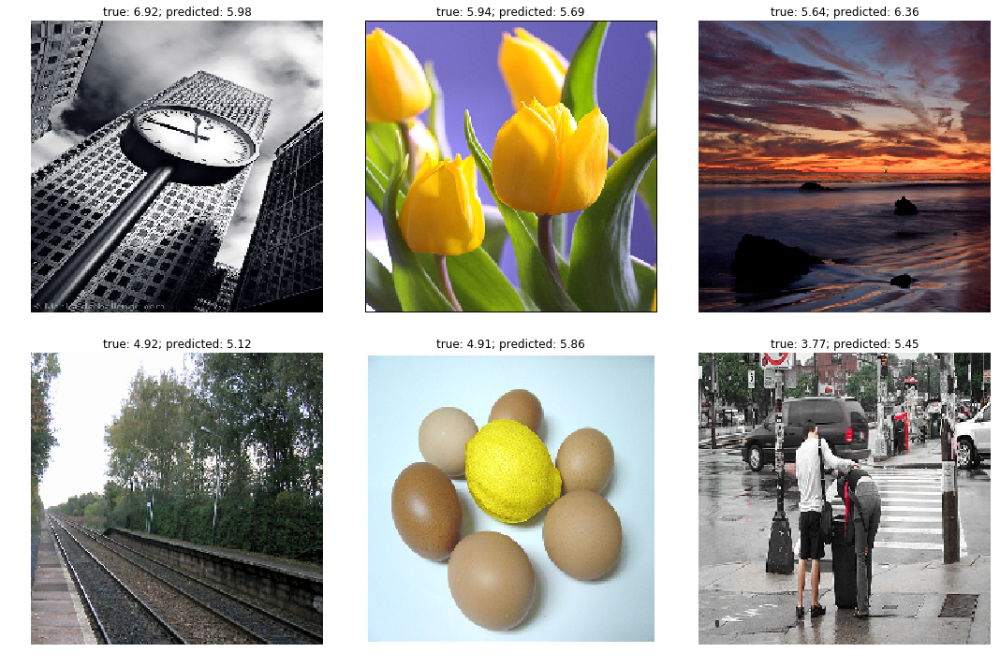

In [88]:
# AVA image visualizations
MODEL_WEIGHTS_FILE = '/Users/christopher.lennan/hotel-image-assessment-aesthetic-server/src/models/MobileNet/weights_mobilenet_09_0.07.hdf5'
KERAS_BASENET_NAME = 'MobileNet'
VALIDATION_SAMPLES_FILE = '/Users/christopher.lennan/hotel-image-assessment/data/AVA/labels/ava_labels.json'
IMAGE_DIR = '/Users/christopher.lennan/github_repos/image-quality-assessment/_readme/images_aesthetic'


# load test samples
samples = load_json(VALIDATION_SAMPLES_FILE)

# load trained model
nima = Nima(KERAS_BASENET_NAME, n_classes=10, learning_rate=1e-3, dropout_rate=0.75)
nima.build()
nima.nima_model.load_weights(MODEL_WEIGHTS_FILE)
nima.compile()


def save_images(image_files, true_scores,  model, target_dir):

    pred_mean_scores = []
    true_mean_scores = []
    imgs = []
    for i, image_file in enumerate(image_files):
        img = load_image(os.path.join(IMAGE_DIR, image_files[i]))
        imgs.append(img)
        prediction = get_prediction(np.expand_dims(img, axis=0), model)
        pred_mean_score = calc_expected_value(prediction)
        true_mean_score = calc_expected_value(true_scores[i])
        pred_mean_scores.append(pred_mean_score)
        true_mean_scores.append(true_mean_score)
        
    idx_sorted_true = np.argsort(true_mean_scores)[::-1]
    idx_sorted_pred = np.argsort(pred_mean_scores)[::-1]
    
    fig = plt.figure(figsize=(15, 10))
    for i, idx in enumerate(idx_sorted_true):
        plt.subplot(2, len(image_files)/2, i+1)
        plt.imshow(imgs[idx])
        plt.title('true: {}; predicted: {}'.format(np.round(true_mean_scores[idx], 2), np.round(pred_mean_scores[idx], 2)))
        plt.axis('off')
    plt.tight_layout()
    extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    plt.savefig(os.path.join(target_dir, image_file+'_aesthetic.svg'), bbox_inches=extent.expanded(1.1, 1.1))

true_scores = get_true_scores(IMAGE_FILES, samples)
save_images(IMAGE_FILES, true_scores, nima, os.path.join(os.getcwd(), '../_readme'))


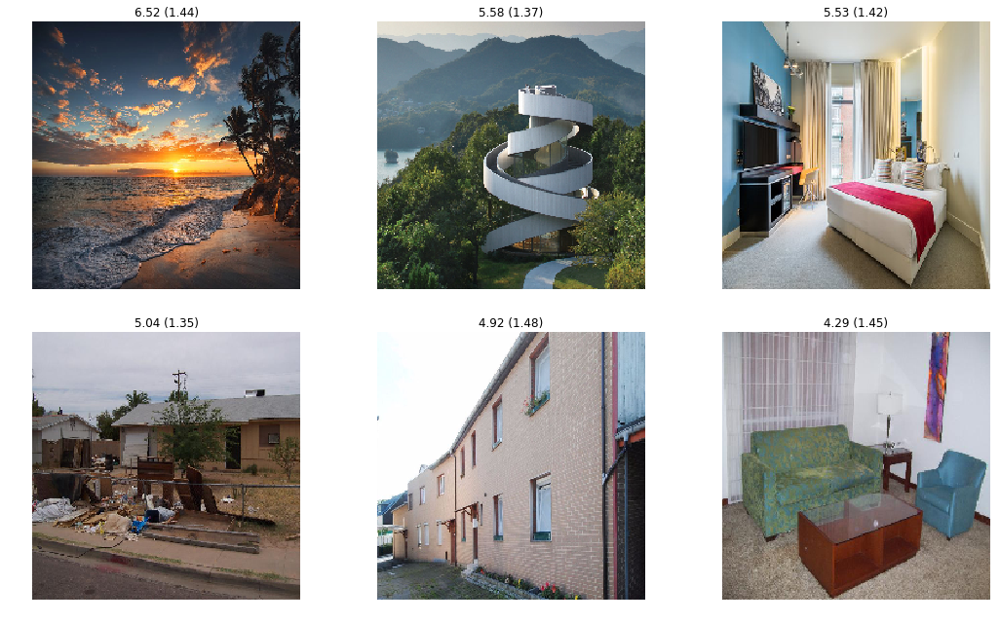

In [20]:
import glob
MODEL_WEIGHTS_FILE = '/Users/christopher.lennan/hotel-image-assessment-aesthetic-server/src/models/MobileNet/weights_mobilenet_09_0.07.hdf5'
KERAS_BASENET_NAME = 'MobileNet'
IMAGE_DIR = '/Users/christopher.lennan/github_repos/image-quality-assessment/_readme/images_aesthetic'


# load trained model
nima = Nima(KERAS_BASENET_NAME, n_classes=10, learning_rate=1e-3, dropout_rate=0.75)
nima.build()
nima.nima_model.load_weights(MODEL_WEIGHTS_FILE)
nima.compile()


def save_images(image_files, model, target_dir):

    pred_mean_scores = []
    pred_std = []
    imgs = []
    for i, image_file in enumerate(image_files):
        img = load_image(os.path.join(IMAGE_DIR, image_files[i]))
        imgs.append(img)
        prediction = get_prediction(np.expand_dims(img, axis=0), model)
        pred_mean_score = calc_expected_value(prediction)
        pred_mean_scores.append(pred_mean_score)
        pred_std.append(calc_std(prediction))

        
    idx_sorted_pred = np.argsort(pred_mean_scores)[::-1]
    
    fig = plt.figure(figsize=(15, 9))
    for i, idx in enumerate(idx_sorted_pred):
        plt.subplot(2, len(image_files)/2, i+1)
        plt.imshow(imgs[idx])
        plt.title('{} ({})'.format(np.round(pred_mean_scores[idx], 2), np.round(pred_std[idx], 2)))
        plt.axis('off')
    plt.tight_layout()
    extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    plt.savefig(os.path.join(target_dir, image_file+'_aesthetic.svg'), bbox_inches=extent.expanded(1, 1))

    
IMAGE_FILES = glob.glob(os.path.join(IMAGE_DIR, '*.jpg'))
save_images(IMAGE_FILES, nima, os.path.join(os.getcwd(), '../_readme/images_aesthetic'))

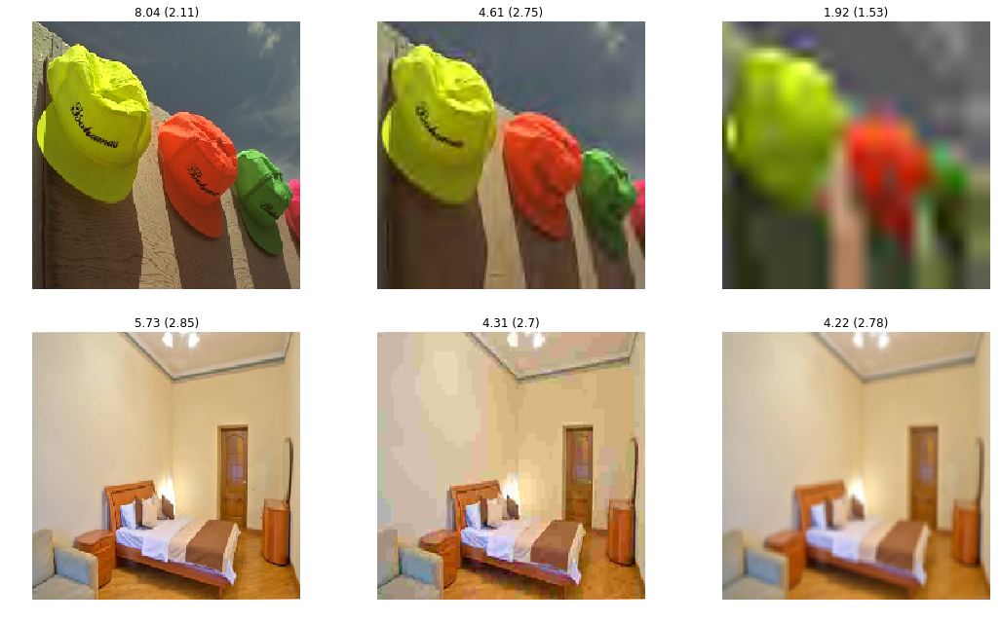

In [27]:

MODEL_WEIGHTS_FILE = '/Users/christopher.lennan/github_repos/image-quality-assessment/models/MobileNet/weights_mobilenet_technical_0.11.hdf5'
KERAS_BASENET_NAME = 'MobileNet'
IMAGE_DIR = '/Users/christopher.lennan/github_repos/image-quality-assessment/_readme/images_technical'


# load trained model
nima = Nima(KERAS_BASENET_NAME, n_classes=10, learning_rate=1e-3, dropout_rate=0.75)
nima.build()
nima.nima_model.load_weights(MODEL_WEIGHTS_FILE)
nima.compile()


def save_images(image_files1, image_files2, model, target_dir):

    pred_mean_scores1 = []
    pred_std1 = []
    imgs1 = []
    for i, image_file in enumerate(image_files1):
        img = load_image(os.path.join(IMAGE_DIR, image_files1[i]))
        imgs1.append(img)
        prediction = get_prediction(np.expand_dims(img, axis=0), model)
        pred_mean_score = calc_expected_value(prediction)
        pred_mean_scores1.append(pred_mean_score)
        pred_std1.append(calc_std(prediction))

        
    idx_sorted_pred1 = np.argsort(pred_mean_scores1)[::-1]
    
    
    pred_mean_scores2 = []
    pred_std2 = []
    imgs2 = []
    for i, image_file in enumerate(image_files2):
        img = load_image(os.path.join(IMAGE_DIR, image_files2[i]))
        imgs2.append(img)
        prediction = get_prediction(np.expand_dims(img, axis=0), model)
        pred_mean_score = calc_expected_value(prediction)
        pred_mean_scores2.append(pred_mean_score)
        pred_std2.append(calc_std(prediction))

        
    idx_sorted_pred2 = np.argsort(pred_mean_scores2)[::-1]
    
    fig = plt.figure(figsize=(15, 9))
    for i, idx in enumerate(idx_sorted_pred1):
        plt.subplot(2, len(image_files1), i+1)
        plt.imshow(imgs1[idx])
        plt.title('{} ({})'.format(np.round(pred_mean_scores1[idx], 2), np.round(pred_std1[idx], 2)))
        plt.axis('off')
    for i, idx in enumerate(idx_sorted_pred2):
        plt.subplot(2, len(image_files2), i+4)
        plt.imshow(imgs2[idx])
        plt.title('{} ({})'.format(np.round(pred_mean_scores2[idx], 2), np.round(pred_std2[idx], 2)))
        plt.axis('off')
    plt.tight_layout()
    extent = fig.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    plt.savefig(os.path.join(target_dir, image_file+'technical.svg'), bbox_inches=extent.expanded(1, 1))

    
IMAGE_FILES1 = glob.glob(os.path.join(IMAGE_DIR, '*.bmp'))
IMAGE_FILES2 = glob.glob(os.path.join(IMAGE_DIR, '*.jpg'))
save_images(IMAGE_FILES1, IMAGE_FILES2, nima, os.path.join(os.getcwd(), '../_readme/images_technical'))

